In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from time import time
from datetime import datetime
from datetime import timedelta
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.forecasting.stl import STLForecast
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima.arima import ndiffs, nsdiffs
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
import statsmodels.api as sm
import statsmodels.tsa.stattools as st
from sklearn.metrics import mean_squared_error
import datetime as dt

## Data

In [129]:
dic = [ "amd","aapl", "ba", "biib", "jpm", "meta", "ngg", "pdd", "ryaay", "tsla"]
company_lst=[ "amd","aapl", "ba", "biib", "jpm", "meta", "ngg", "pdd", "ryaay", "tsla"]
in_path="~/Desktop/dsa5205/project/DSA5205_project-main/data/stocks/"
for i, ticker in enumerate(dic):
    stock = in_path + f"{ticker}.csv"
    stock_df = pd.read_csv(stock, index_col="Date")[["Adj Close"]]
    if i == 0:
        df_close = stock_df
        df_close.columns = [ticker]
    else:
        df_close[ticker] = stock_df
df_close = df_close.dropna()
df_close.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-03,150.240005,181.259918,207.860001,244.139999,156.752411,338.540009,70.250885,56.099998,106.440002,399.926666
2022-01-04,144.419998,178.959457,213.630005,241.729996,162.694855,336.529999,70.386894,49.820000,109.050003,383.196655
2022-01-05,136.149994,174.199158,213.070007,239.270004,159.720444,324.170013,69.706833,48.529999,110.250000,362.706665
2022-01-06,136.229996,171.291183,211.339996,237.300003,161.417328,332.459991,69.007339,52.130001,111.599998,354.899994
2022-01-07,132.000000,171.460495,215.500000,232.600006,163.016678,331.790009,69.570824,55.900002,115.989998,342.320007


In [2]:
# df = pd.read_csv('total.csv', index_col=[0])
# df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Company
0,01-03,177.097152,182.126343,176.977651,181.259918,104487900.0,0.0,0.0,apple
1,01-04,181.877375,182.186095,178.381831,178.959442,99310400.0,0.0,0.0,apple
2,01-05,178.869833,179.427523,173.920313,174.199158,94537600.0,0.0,0.0,apple
3,01-06,171.988296,174.577587,170.932666,171.291183,96904000.0,0.0,0.0,apple
4,01-07,172.177529,173.422378,170.325193,171.460495,86709100.0,0.0,0.0,apple


In [3]:
# df_p = df[df.Company != 'nasdq']
# #df_p['Date'] = "2022-"+df_p['Date']
# #df_p['Date'] = df_p['Date'].apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))


In [130]:
company_lst = list(df_close.columns)
company_lst

['amd', 'aapl', 'ba', 'biib', 'jpm', 'meta', 'ngg', 'pdd', 'ryaay', 'tsla']

In [131]:
df_return=df_close.pct_change().dropna()
df_return.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-04,-0.038738,-0.012692,0.027759,-0.009871,0.037910,-0.005937,0.001936,-0.111943,0.024521,-0.041833
2022-01-05,-0.057264,-0.026600,-0.002621,-0.010177,-0.018282,-0.036728,-0.009662,-0.025893,0.011004,-0.053471
2022-01-06,0.000588,-0.016693,-0.008119,-0.008233,0.010624,0.025573,-0.010035,0.074181,0.012245,-0.021523
2022-01-07,-0.031050,0.000988,0.019684,-0.019806,0.009908,-0.002015,0.008166,0.072319,0.039337,-0.035447
2022-01-10,0.000000,0.000116,-0.028724,0.011651,0.000957,-0.011212,-0.000978,0.019499,-0.000172,0.030342


## Data preprocessing

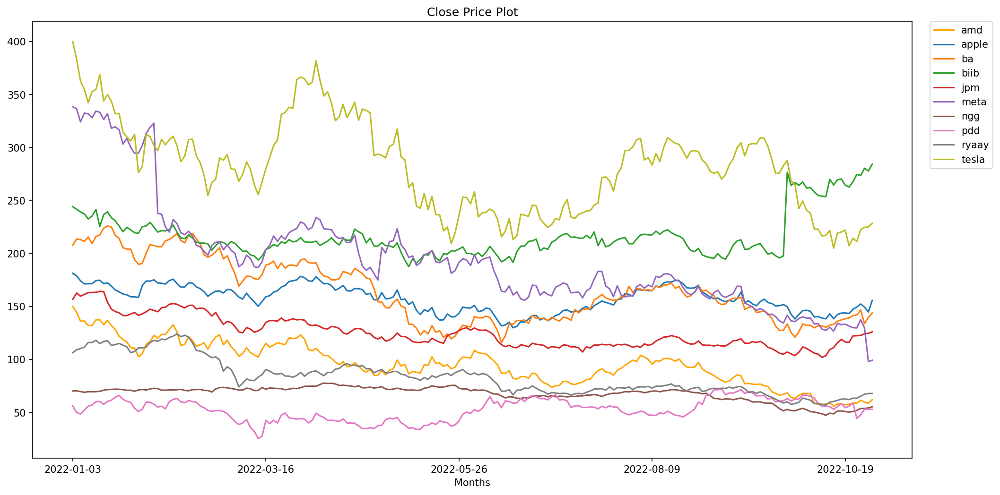

In [133]:
# code
# Visualizing The Close Price of all the stocks
  
# to set the plot size
plt.figure(figsize=(16, 8), dpi=150)
  
# using plot method to plot open prices.
# in plot method we set the label and color of the curve.
df_close['amd'].plot(label='amd', color='orange')
df_close['aapl'].plot(label='apple')
df_close['ba'].plot(label='ba')
df_close['biib'].plot(label='biib')
df_close['jpm'].plot(label='jpm')
df_close['meta'].plot(label='meta')
df_close['ngg'].plot(label='ngg')
df_close['pdd'].plot(label='pdd')
df_close['ryaay'].plot(label='ryaay')
df_close['tsla'].plot(label='tesla')
  
# adding title to the plot
plt.title('Close Price Plot')
  
# adding Label to the x-axis
plt.xlabel('Months')
  
# adding legend to the curve
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

## Test

#### Ljung Box Text

In [9]:
# df_lb = pd.DataFrame()
# for i in range(10):
#     df_lb = pd.concat([df_lb, sm.stats.acorr_ljungbox(df_close[df_p['Company'].unique()[i]], lags=[10], return_df=True)])

In [10]:
# df_lb.set_index(df_p['Company'].unique())

,lb_stat,lb_pvalue
apple,1168.465887,9.119436e-245
pdd,1122.608955,7.050922e-235
tesla,1108.341972,8.396593e-232
meta,1245.735526,1.959445e-261
jpm,1256.491294,9.363935e-264
amd,1094.636588,7.561595e-229
ngg,1052.819559,7.789837e-220
biib,424.405732,5.977021e-85
ba,1440.841353,1.505996e-303
ryaay,1413.222485,1.385509e-297


The time series is not white noise series

#### Augmented Dickey Fuller Test

In [11]:
# df_adf = pd.DataFrame(index = df_p['Company'].unique(), columns = ['adf', 'adf_pvalue'] )
# for i in range(10):
#     adf = st.adfuller(df_close[df_p['Company'].unique()[i]],maxlag = 12)
#     df_adf.iloc[i,0] = adf[0]
#     df_adf.iloc[i,1] = adf[1]

In [12]:
# df_adf

,adf,adf_pvalue
apple,-2.145181,0.226739
pdd,-2.034562,0.271628
tesla,-2.562305,0.101041
meta,-2.477813,0.120967
jpm,-1.615697,0.474986
amd,-1.610307,0.477814
ngg,1.096432,0.995186
biib,-3.497487,0.008052
ba,-1.11075,0.710766
ryaay,-1.523233,0.521989


biib is stationary, other time series are not stationary

## Model building

In [145]:
df_train = df_close[df_close.index < '2022-08-01']
df_val = df_close[(df_close.index >= '2022-08-01') & (df_close.index <= '2022-09-30')]
df_train

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-03,150.240005,181.259918,207.860001,244.139999,156.752411,338.540009,70.250885,56.099998,106.440002,399.926666
2022-01-04,144.419998,178.959457,213.630005,241.729996,162.694855,336.529999,70.386894,49.820000,109.050003,383.196655
2022-01-05,136.149994,174.199158,213.070007,239.270004,159.720444,324.170013,69.706833,48.529999,110.250000,362.706665
2022-01-06,136.229996,171.291183,211.339996,237.300003,161.417328,332.459991,69.007339,52.130001,111.599998,354.899994
2022-01-07,132.000000,171.460495,215.500000,232.600006,163.016678,331.790009,69.570824,55.900002,115.989998,342.320007
...,...,...,...,...,...,...,...,...,...,...
2022-07-25,87.540001,152.737839,156.639999,207.570007,114.198273,166.649994,67.570000,56.209999,74.260002,268.433319
2022-07-26,85.250000,151.389725,155.919998,210.850006,112.414230,159.149994,68.120003,55.160000,71.279999,258.859985
2022-07-27,89.820000,156.572510,156.089996,212.919998,114.218094,169.580002,68.000000,54.990002,73.389999,274.820007


In [146]:
df_val.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-01,96.779999,161.285965,169.070007,209.259995,113.197227,159.929993,69.379997,47.689999,74.000000,297.276672
2022-08-02,99.290001,159.788040,163.279999,209.149994,111.433014,160.190002,70.070000,48.980000,71.620003,300.586670
2022-08-03,98.089996,165.899567,166.639999,213.600006,112.602547,168.800003,69.830002,49.650002,73.699997,307.396667
2022-08-04,103.910004,165.580002,166.500000,217.300003,111.363632,170.570007,69.610001,51.259998,74.169998,308.633331
2022-08-05,102.309998,165.350006,165.039993,218.199997,114.733490,167.110001,68.550003,50.250000,74.000000,288.170013


In [147]:
test_df

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-10-03,0.043403,0.030753,0.041047,-0.010112,0.030909,0.021595,0.026004,0.001119,0.019000,-0.086145
2022-10-04,0.027076,0.025623,0.059183,0.011918,0.046784,0.012048,0.018725,0.060974,0.068201,0.029043
2022-10-05,0.000589,0.002053,-0.010486,-0.021537,-0.012347,-0.009267,-0.025065,-0.004513,-0.016512,-0.034598
2022-10-06,-0.001325,-0.006626,0.000681,0.002178,-0.020382,0.000648,-0.032946,-0.013752,-0.015830,-0.011129
2022-10-07,-0.138688,-0.036719,-0.018230,-0.016663,-0.019974,-0.040411,-0.008468,-0.026050,-0.050690,-0.063243
2022-10-10,-0.010780,0.002356,0.016257,-0.012059,-0.009341,0.002548,-0.017478,-0.083386,0.001198,-0.000493
2022-10-11,-0.003114,-0.010255,-0.002502,-0.002787,-0.028860,-0.039241,-0.016778,-0.043769,-0.018632,-0.028974
2022-10-12,0.003817,-0.004605,-0.008741,-0.001574,0.016183,-0.008091,-0.028372,0.004129,-0.009058,0.003418
2022-10-13,0.018842,0.033613,0.015182,0.064138,0.055593,0.021882,0.042954,-0.010189,0.050448,0.020622


In [148]:
df_pre = df_val.copy(deep=True)

In [149]:
df_pre.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-01,96.779999,161.285965,169.070007,209.259995,113.197227,159.929993,69.379997,47.689999,74.000000,297.276672
2022-08-02,99.290001,159.788040,163.279999,209.149994,111.433014,160.190002,70.070000,48.980000,71.620003,300.586670
2022-08-03,98.089996,165.899567,166.639999,213.600006,112.602547,168.800003,69.830002,49.650002,73.699997,307.396667
2022-08-04,103.910004,165.580002,166.500000,217.300003,111.363632,170.570007,69.610001,51.259998,74.169998,308.633331
2022-08-05,102.309998,165.350006,165.039993,218.199997,114.733490,167.110001,68.550003,50.250000,74.000000,288.170013


### Apple

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


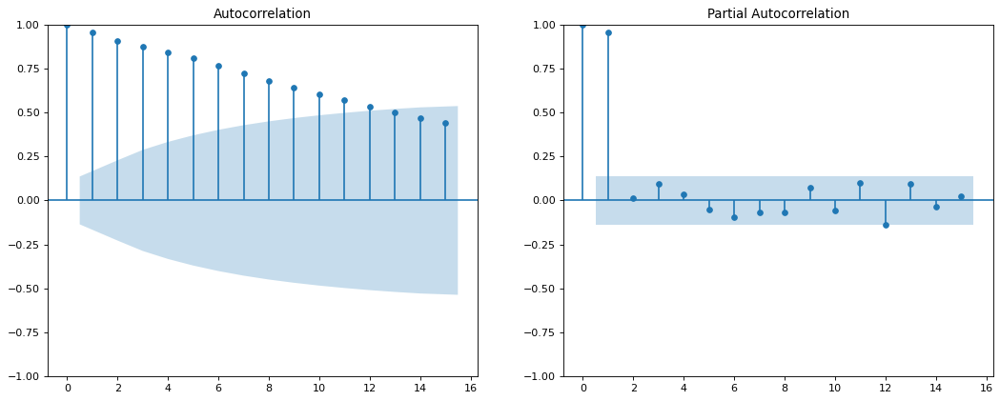

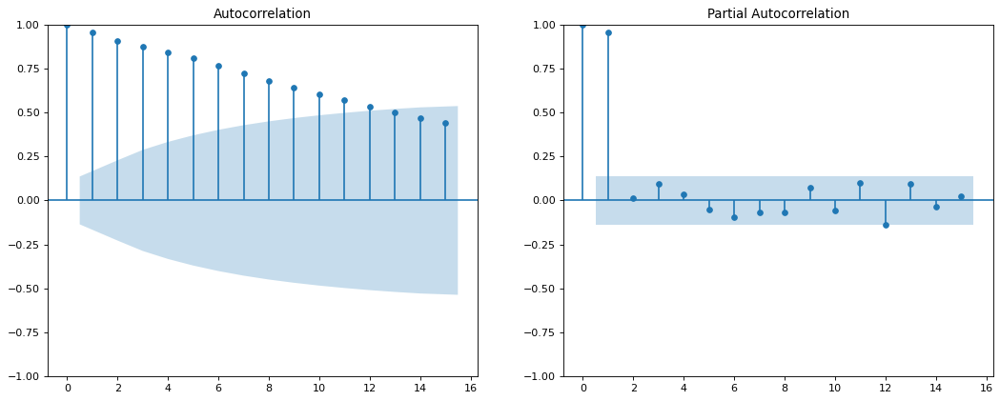

In [151]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.aapl, ax=ax1, lags=15)
plot_pacf(df_close.aapl, ax=ax2, lags=15)

In [152]:
training_data = df_train.aapl.values
test_data = df_val.aapl.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=162.320662, expected=161.285965
predicted=160.971089, expected=159.788040
predicted=159.834395, expected=165.899567
predicted=166.032693, expected=165.580002
predicted=165.175066, expected=165.350006
predicted=165.370032, expected=164.869995
predicted=164.883148, expected=164.919998
predicted=164.951562, expected=169.240005
predicted=169.254042, expected=168.490005
predicted=168.200732, expected=172.100006
predicted=172.144165, expected=173.190002
predicted=172.986338, expected=173.029999
predicted=172.967319, expected=174.550003
predicted=174.562786, expected=174.149994
predicted=174.063884, expected=171.520004
predicted=171.536186, expected=167.570007
predicted=167.686639, expected=167.229996
predicted=167.450657, expected=167.529999
predicted=167.552253, expected=170.029999
predicted=170.038119, expected=163.619995
predicted=163.467194, expected=161.380005
predicted=161.754399, expected=158.910004
predicted=158.995136, expected=157.220001
predicted=157.316905, expected=157

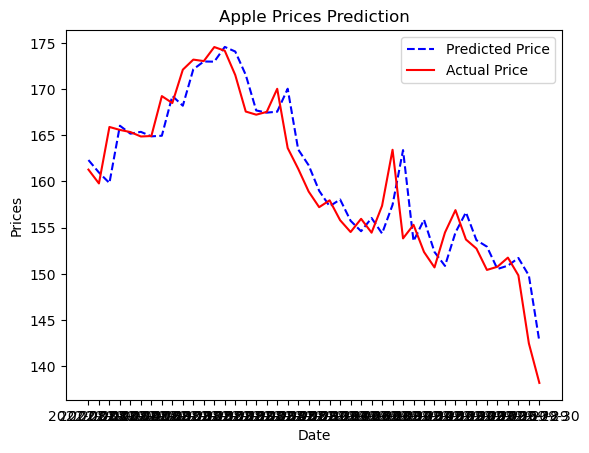

In [153]:
test_set_range = df_val.aapl.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('Apple Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()

In [154]:
df_pre['aapl'] = model_predictions

### AMD

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


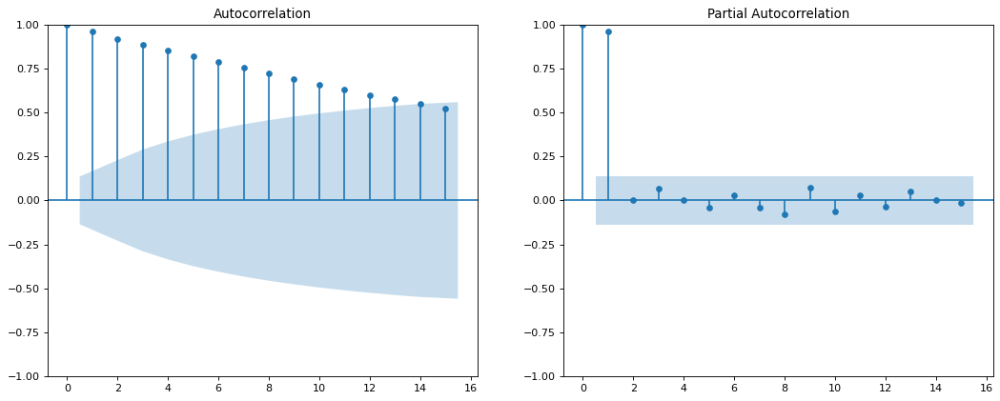

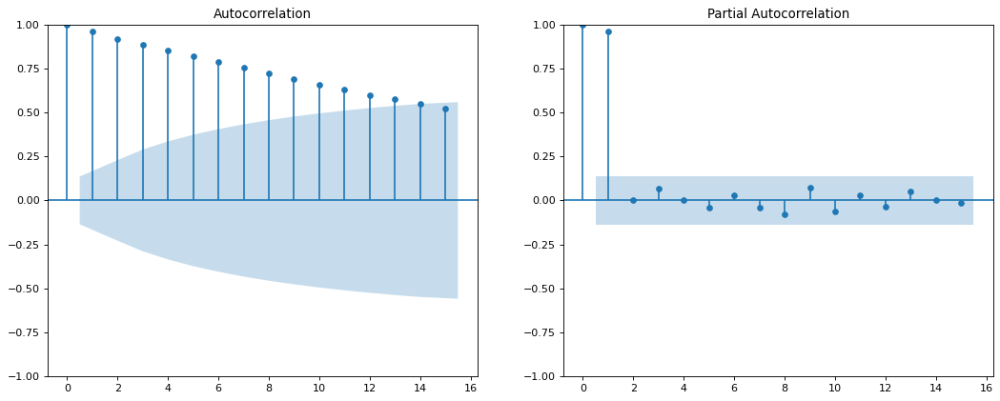

In [155]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.amd, ax=ax1, lags=15)
plot_pacf(df_close.amd, ax=ax2, lags=15)

In [156]:
training_data = df_train.amd.values
test_data = df_val.amd.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=94.422888, expected=96.779999
predicted=96.713557, expected=99.290001
predicted=99.251193, expected=98.089996
predicted=98.014769, expected=103.910004
predicted=103.959894, expected=102.309998
predicted=102.191885, expected=100.070000
predicted=100.105739, expected=95.540001
predicted=95.563164, expected=99.050003
predicted=99.162889, expected=98.120003
predicted=98.039630, expected=100.830002
predicted=100.841509, expected=101.010002
predicted=100.956359, expected=100.199997
predicted=100.198240, expected=98.269997
predicted=98.290093, expected=100.440002
predicted=100.473731, expected=95.949997
predicted=95.942148, expected=92.839996
predicted=92.937488, expected=92.489998
predicted=92.551606, expected=92.730003
predicted=92.736635, expected=97.180000
predicted=97.170799, expected=91.180000
predicted=91.150261, expected=88.489998
predicted=88.656297, expected=86.940002
predicted=87.003287, expected=84.870003
predicted=84.904540, expected=82.330002
predicted=82.367602, expec

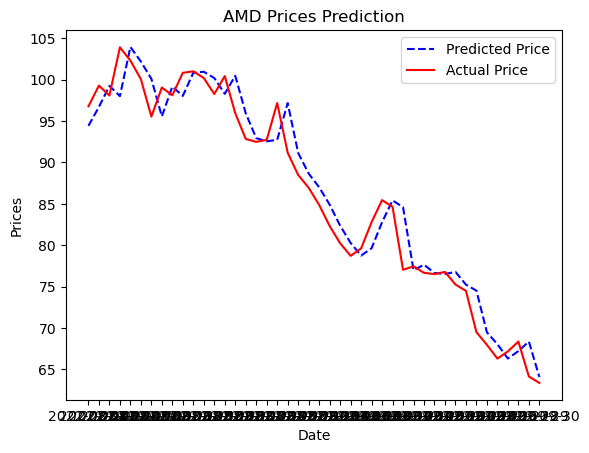

In [157]:
test_set_range = df_val.amd.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('AMD Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['amd'] = model_predictions

### Ba

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


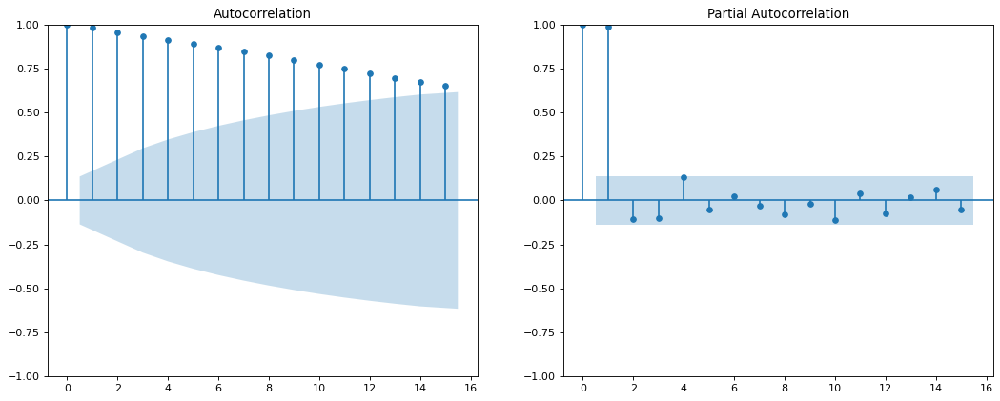

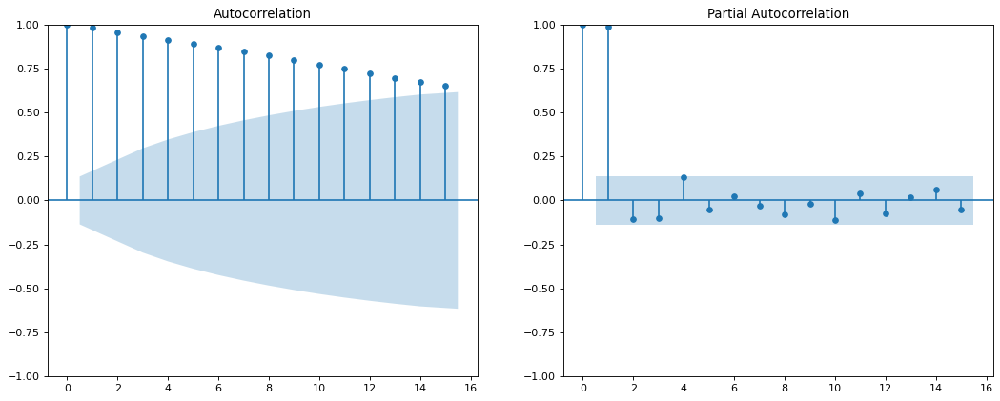

In [158]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.ba, ax=ax1, lags=15)
plot_pacf(df_close.ba, ax=ax2, lags=15)

In [159]:
training_data = df_train.ba.values
test_data = df_val.ba.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=159.646896, expected=169.070007
predicted=169.831982, expected=163.279999
predicted=164.070802, expected=166.639999
predicted=166.111024, expected=166.500000
predicted=166.902244, expected=165.039993
predicted=164.943770, expected=165.889999
predicted=165.760235, expected=164.850006
predicted=164.896668, expected=169.020004
predicted=169.112704, expected=167.880005
predicted=168.330921, expected=169.990005
predicted=169.955408, expected=170.470001
predicted=170.755713, expected=172.080002
predicted=172.221932, expected=167.199997
predicted=167.160995, expected=168.690002
predicted=168.150768, expected=162.919998
predicted=162.859232, expected=158.979996
predicted=158.032503, expected=160.070007
predicted=159.622987, expected=163.600006
predicted=163.909864, expected=169.380005
predicted=170.134301, expected=164.529999
predicted=164.993573, expected=165.419998
predicted=164.878522, expected=162.210007
predicted=162.173983, expected=160.250000
predicted=159.763198, expected=153

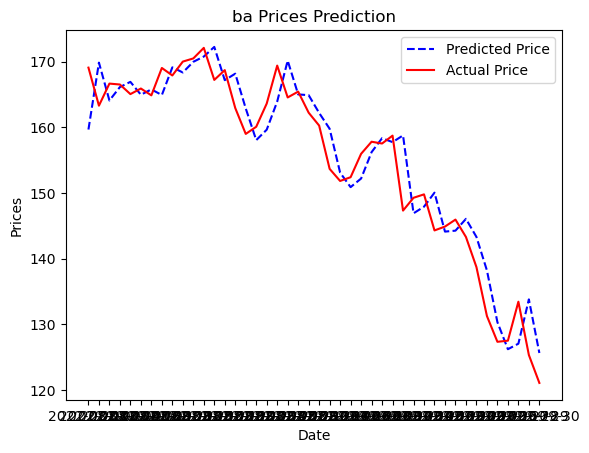

In [160]:
test_set_range = df_val.ba.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('ba Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['ba'] = model_predictions

### Biib

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


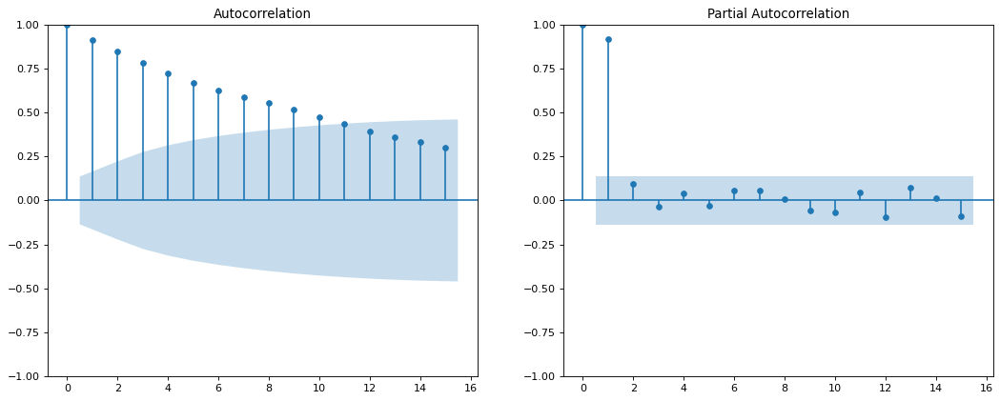

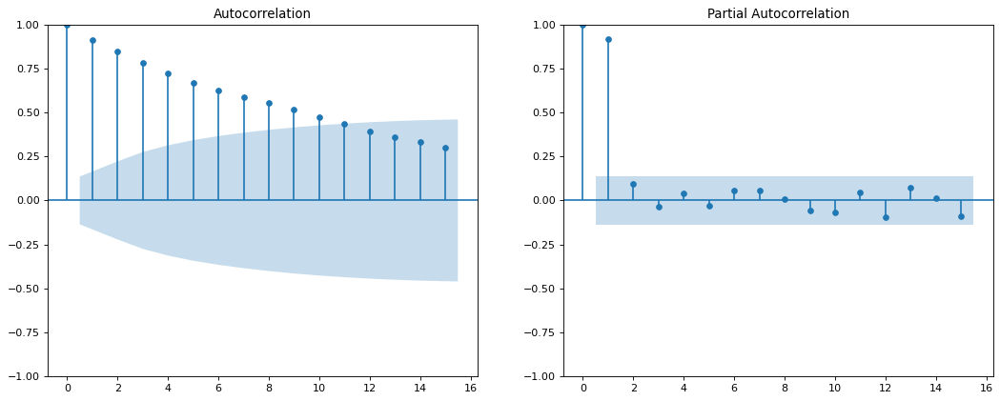

In [161]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.biib, ax=ax1, lags=15)
plot_pacf(df_close.biib, ax=ax2, lags=15)

In [162]:
training_data = df_train.biib.values
test_data = df_val.biib.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(4,0,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=214.886682, expected=209.259995
predicted=210.703135, expected=209.149994
predicted=209.600609, expected=213.600006
predicted=212.874764, expected=217.300003
predicted=216.351025, expected=218.199997
predicted=217.724347, expected=217.559998
predicted=217.538293, expected=217.589996
predicted=217.561540, expected=221.039993
predicted=220.222003, expected=218.220001
predicted=218.620964, expected=220.990005
predicted=220.306368, expected=222.380005
predicted=221.880883, expected=219.639999
predicted=220.009297, expected=217.580002
predicted=218.060228, expected=216.339996
predicted=216.750615, expected=214.089996
predicted=214.715797, expected=207.699997
predicted=209.323589, expected=202.809998
predicted=204.298554, expected=201.779999
predicted=202.568613, expected=204.830002
predicted=204.800976, expected=198.589996
predicted=200.302994, expected=197.110001
predicted=198.141703, expected=196.080002
predicted=196.968763, expected=195.380005
predicted=196.206800, expected=199

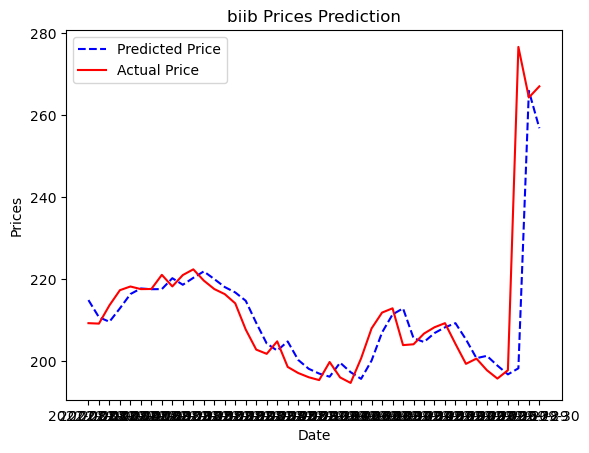

In [163]:
test_set_range = df_val.biib.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('biib Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['biib'] = model_predictions

### JPM

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


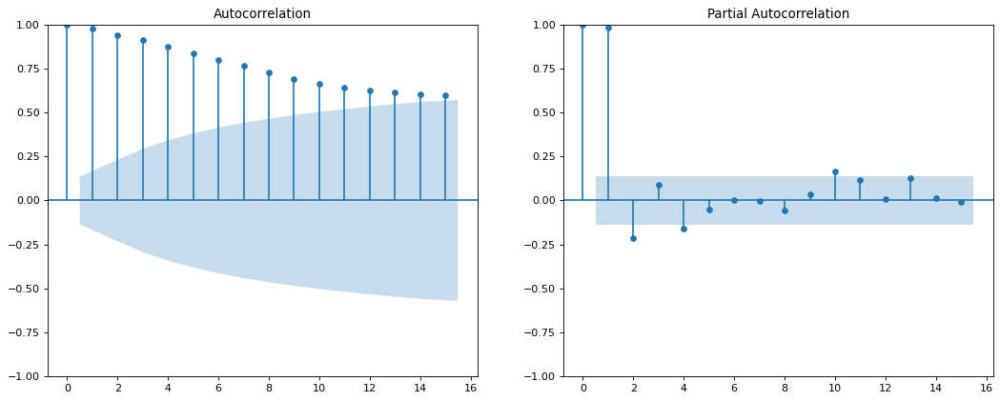

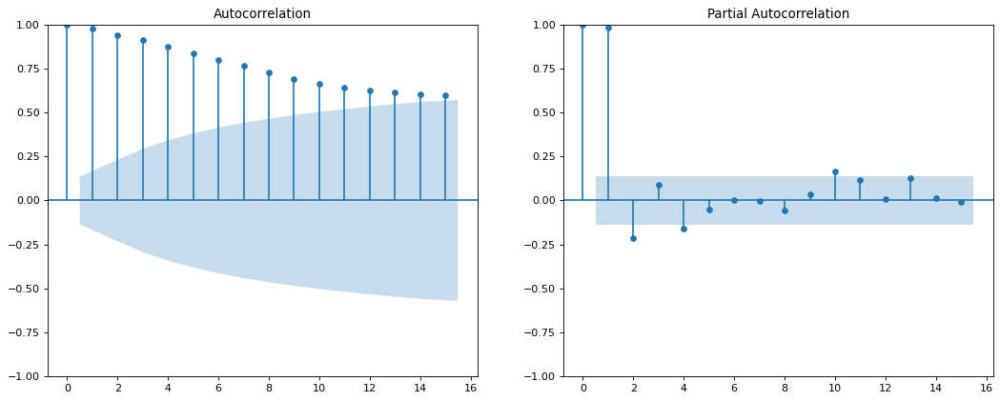

In [164]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.jpm, ax=ax1, lags=15)
plot_pacf(df_close.jpm, ax=ax2, lags=15)

In [165]:
training_data = df_train.jpm.values
test_data = df_val.jpm.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(3,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=114.631503, expected=113.197227
predicted=112.969427, expected=111.433014
predicted=111.316577, expected=112.602547
predicted=112.738439, expected=111.363632
predicted=110.943147, expected=114.733490
predicted=115.333334, expected=113.335983
predicted=112.901983, expected=114.356850
predicted=114.845727, expected=117.340164
predicted=117.501659, expected=119.074646
predicted=119.265018, expected=121.046997
predicted=121.537201, expected=121.374069
predicted=121.519166, expected=122.533691
predicted=122.872785, expected=121.502914
predicted=121.367860, expected=120.561340
predicted=120.599514, expected=117.578033
predicted=117.130792, expected=115.635414
predicted=115.384219, expected=114.495605
predicted=114.106227, expected=114.773132
predicted=114.655727, expected=117.498749
predicted=117.747387, expected=113.653145
predicted=113.118749, expected=113.375633
predicted=113.732960, expected=113.395462
predicted=113.038529, expected=112.721489
predicted=112.612571, expected=113

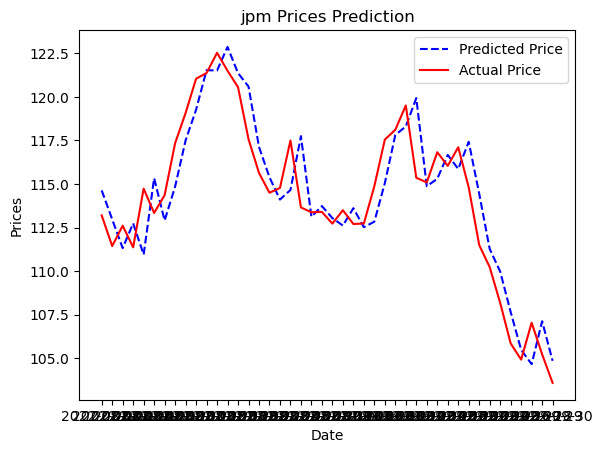

In [166]:
test_set_range = df_val.ba.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('jpm Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['jpm'] = model_predictions

### Meta

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


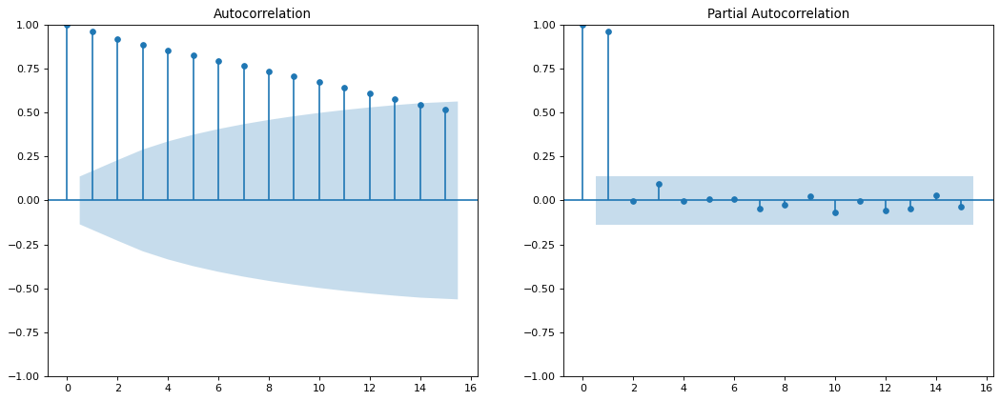

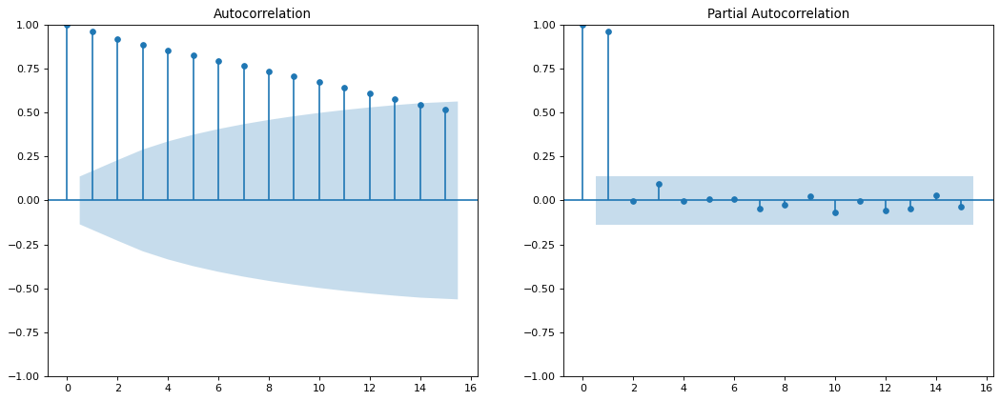

In [167]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.meta, ax=ax1, lags=15)
plot_pacf(df_close.meta, ax=ax2, lags=15)

In [168]:
training_data = df_train.meta.values
test_data = df_val.meta.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=158.873090, expected=159.929993
predicted=159.838411, expected=160.190002
predicted=160.205755, expected=168.800003
predicted=168.419113, expected=170.570007
predicted=170.783287, expected=167.110001
predicted=167.320100, expected=170.250000
predicted=169.997461, expected=168.529999
predicted=168.709673, expected=178.339996
predicted=177.824439, expected=177.490005
predicted=177.866540, expected=180.500000
predicted=180.328381, expected=180.889999
predicted=180.980320, expected=179.470001
predicted=179.550363, expected=174.850006
predicted=175.013426, expected=174.660004
predicted=174.503875, expected=167.960007
predicted=168.261264, expected=163.050003
predicted=163.010302, expected=161.110001
predicted=161.002787, expected=163.259995
predicted=163.092937, expected=168.779999
predicted=168.625396, expected=161.779999
predicted=162.296103, expected=159.169998
predicted=159.038117, expected=157.160004
predicted=157.153058, expected=162.929993
predicted=162.604666, expected=165

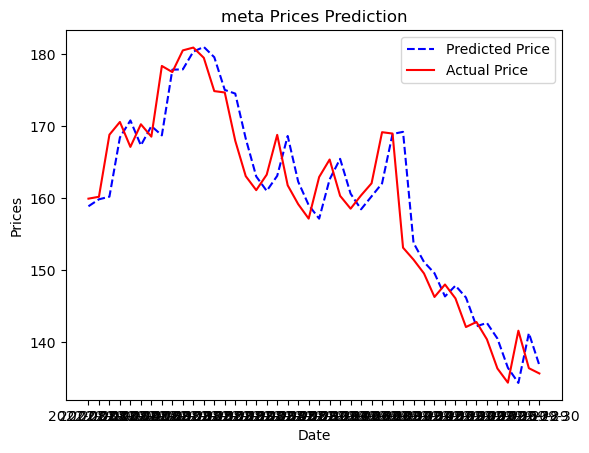

In [169]:
test_set_range = df_val.meta.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('meta Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['meta'] = model_predictions

### Ngg

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


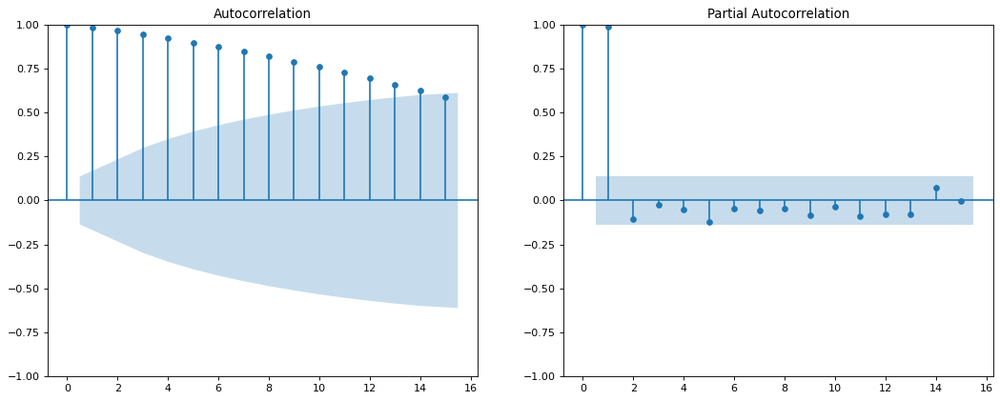

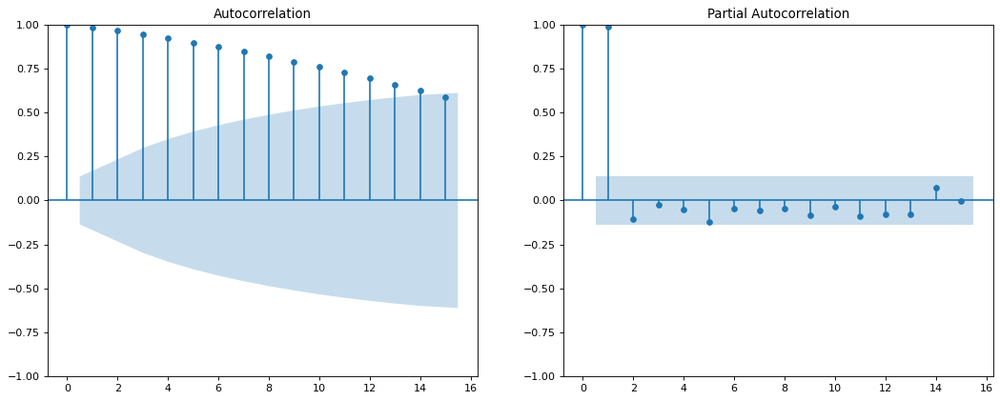

In [170]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.ngg, ax=ax1, lags=15)
plot_pacf(df_close.ngg, ax=ax2, lags=15)

In [171]:
training_data = df_train.ngg.values
test_data = df_val.ngg.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=69.529008, expected=69.379997
predicted=69.329731, expected=70.070000
predicted=70.055182, expected=69.830002
predicted=69.798940, expected=69.610001
predicted=69.633951, expected=68.550003
predicted=68.605868, expected=69.320000
predicted=69.348114, expected=70.080002
predicted=69.996991, expected=70.239998
predicted=70.184407, expected=69.470001
predicted=69.491259, expected=70.419998
predicted=70.427269, expected=70.669998
predicted=70.592882, expected=71.529999
predicted=71.476949, expected=71.410004
predicted=71.361531, expected=70.790001
predicted=70.824997, expected=70.190002
predicted=70.255006, expected=70.239998
predicted=70.277222, expected=69.269997
predicted=69.306521, expected=68.680000
predicted=68.760558, expected=68.570000
predicted=68.609053, expected=67.559998
predicted=67.600777, expected=68.040001
predicted=68.077921, expected=66.019997
predicted=66.090250, expected=63.189999
predicted=63.296993, expected=63.060001
predicted=63.188391, expected=62.150002


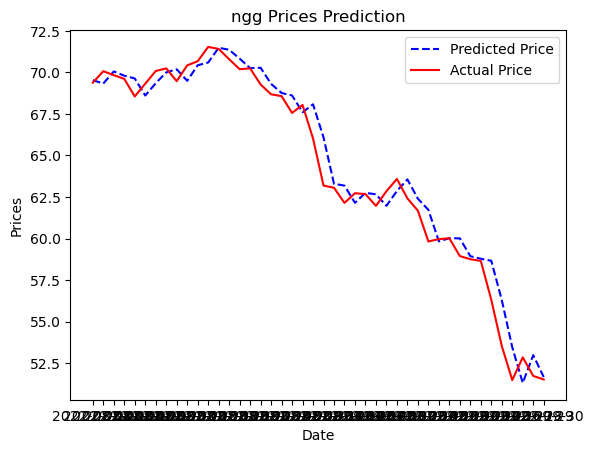

In [172]:
test_set_range = df_val.ngg.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('ngg Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['ngg'] = model_predictions

### Pdd

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


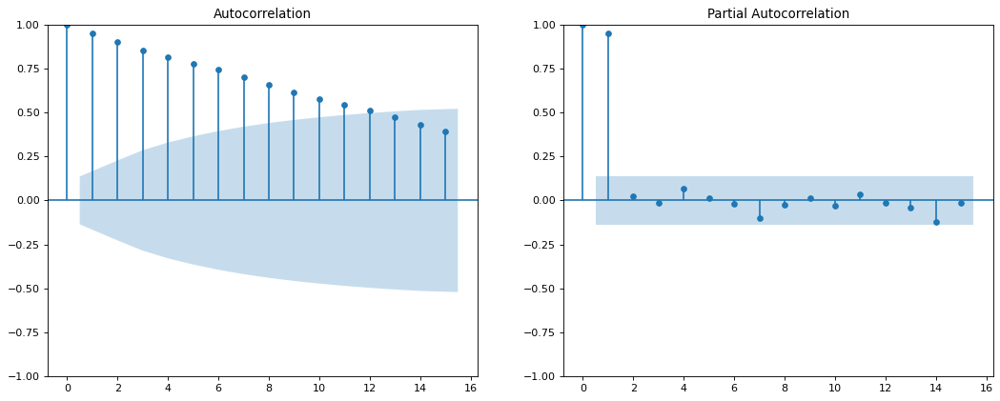

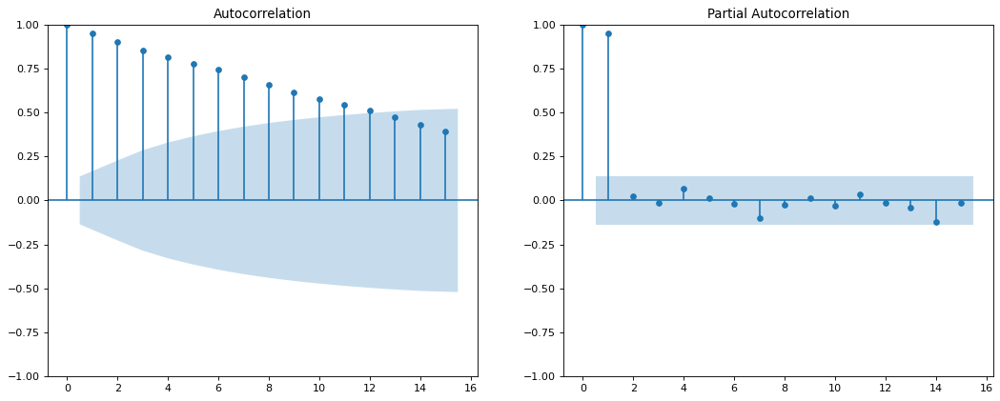

In [173]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.pdd, ax=ax1, lags=15)
plot_pacf(df_close.pdd, ax=ax2, lags=15)

In [174]:
training_data = df_train.pdd.values
test_data = df_val.pdd.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=49.105901, expected=47.689999
predicted=47.720712, expected=48.980000
predicted=49.027408, expected=49.650002
predicted=49.623405, expected=51.259998
predicted=51.262109, expected=50.250000
predicted=50.198524, expected=47.669998
predicted=47.666585, expected=47.330002
predicted=47.397457, expected=47.259998
predicted=47.268466, expected=49.619999
predicted=49.652217, expected=48.799999
predicted=48.724175, expected=51.130001
predicted=51.173579, expected=49.340000
predicted=49.272448, expected=47.509998
predicted=47.539425, expected=46.830002
predicted=46.869181, expected=45.759998
predicted=45.764749, expected=47.930000
predicted=47.976595, expected=50.509998
predicted=50.485294, expected=53.209999
predicted=53.198102, expected=59.830002
predicted=59.989422, expected=57.570000
predicted=57.422525, expected=66.040001
predicted=66.046181, expected=66.500000
predicted=66.669586, expected=71.300003
predicted=71.366067, expected=71.419998
predicted=71.627991, expected=72.190002


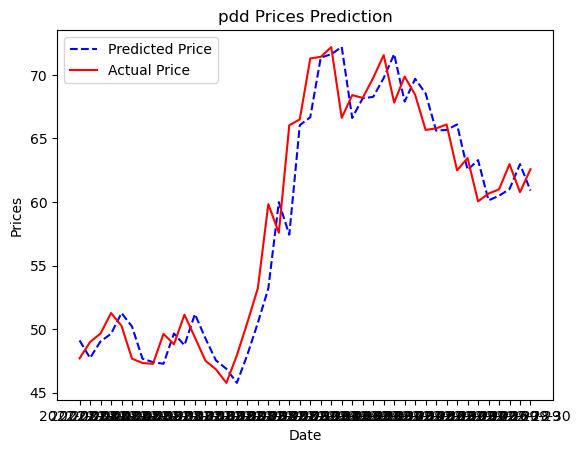

In [175]:
test_set_range = df_val.pdd.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('pdd Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['pdd'] = model_predictions

### Ryaay

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


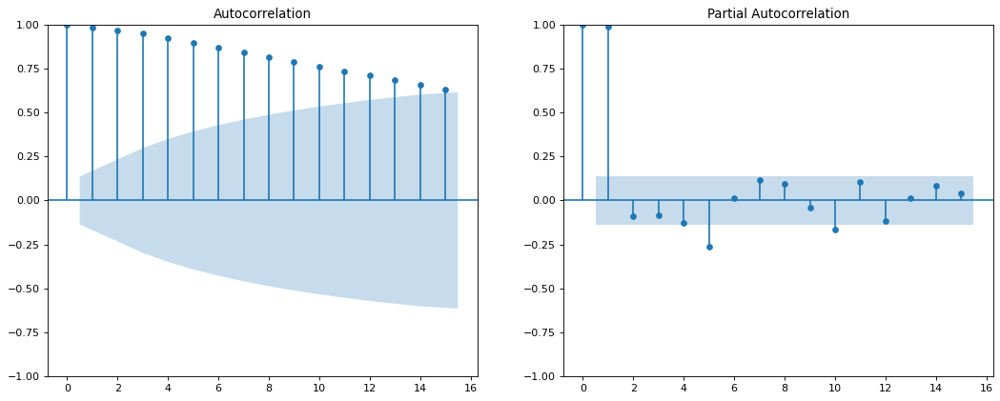

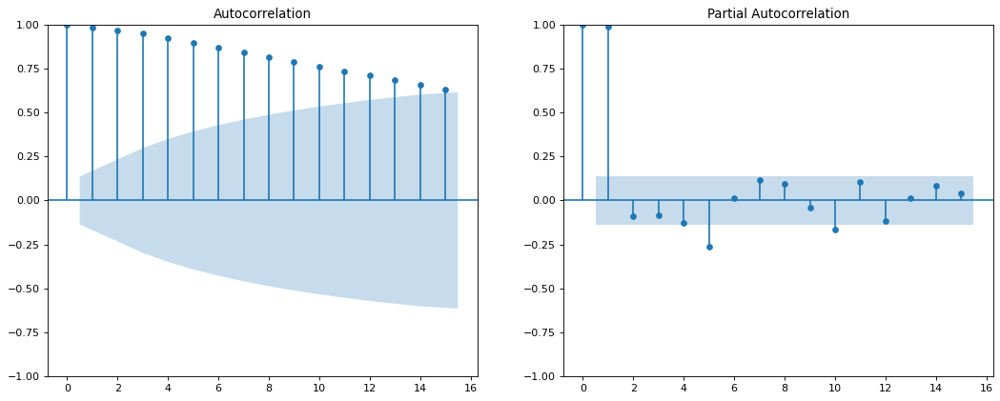

In [176]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.ryaay, ax=ax1, lags=15)
plot_pacf(df_close.ryaay, ax=ax2, lags=15)

In [177]:
training_data = df_train.ryaay.values
test_data = df_val.ryaay.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=72.981604, expected=74.000000
predicted=74.031878, expected=71.620003
predicted=71.579916, expected=73.699997
predicted=73.640503, expected=74.169998
predicted=74.297609, expected=74.000000
predicted=74.018902, expected=74.529999
predicted=74.539441, expected=72.940002
predicted=72.914192, expected=74.790001
predicted=74.761097, expected=74.639999
predicted=74.736398, expected=75.190002
predicted=75.198655, expected=75.849998
predicted=75.901008, expected=76.910004
predicted=76.980566, expected=74.739998
predicted=74.733544, expected=75.250000
predicted=75.145085, expected=71.779999
predicted=71.718910, expected=70.510002
predicted=70.258417, expected=72.349998
predicted=72.332808, expected=73.070000
predicted=73.190176, expected=73.699997
predicted=73.758172, expected=69.769997
predicted=69.693903, expected=70.440002
predicted=70.250495, expected=72.300003
predicted=72.379384, expected=72.709999
predicted=72.805317, expected=72.570000
predicted=72.584643, expected=72.769997


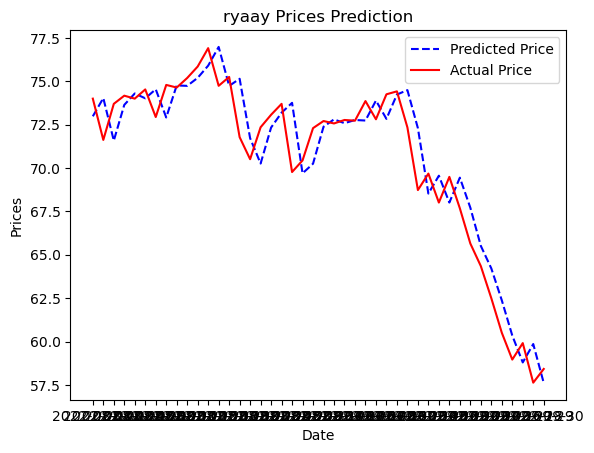

In [178]:
test_set_range = df_val.ryaay.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('ryaay Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['ryaay'] = model_predictions

### Tesla

/Users/ruichiwu/miniforge3/envs/tf/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


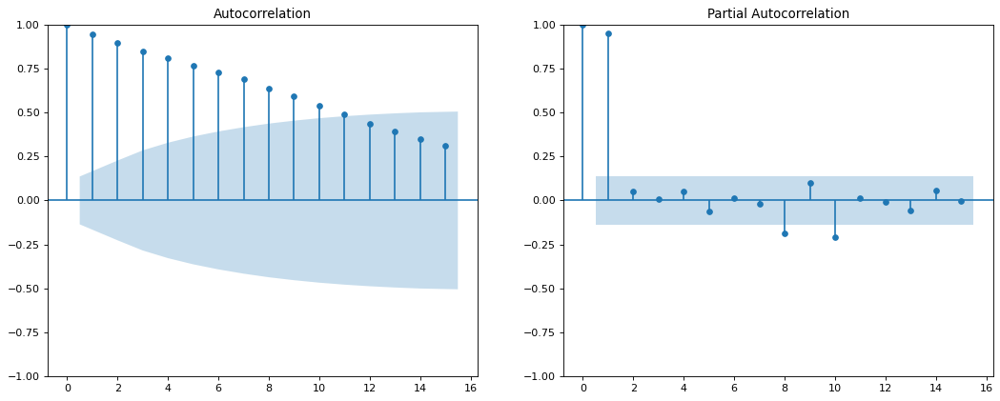

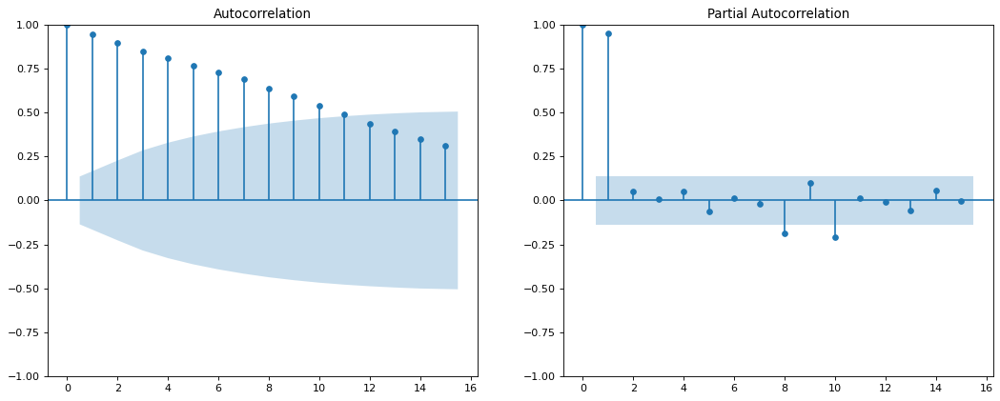

In [180]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,6), dpi= 80)
plot_acf(df_close.tsla, ax=ax1, lags=15)
plot_pacf(df_close.tsla, ax=ax2, lags=15)

In [181]:
training_data = df_train.tsla.values
test_data = df_val.tsla.values
history = [x for x in training_data]
model_predictions = []
N_test_observations = len(test_data)
for time_point in range(N_test_observations):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    model_predictions.append(yhat)
    true_test_value = test_data[time_point]
    history.append(true_test_value)
    print('predicted=%f, expected=%f' % (yhat, true_test_value))
MSE_error = mean_squared_error(test_data, model_predictions)
print('Testing Mean Squared Error is {}'.format(MSE_error))

predicted=296.482328, expected=297.276672
predicted=297.411151, expected=300.586670
predicted=300.444222, expected=307.396667
predicted=307.144759, expected=308.633331
predicted=308.658969, expected=288.170013
predicted=289.065244, expected=290.423340
predicted=290.223369, expected=283.333344
predicted=283.677755, expected=294.356659
predicted=293.738125, expected=286.630005
predicted=287.185281, expected=300.029999
predicted=299.127963, expected=309.320007
predicted=309.086268, expected=306.563324
predicted=306.848478, expected=303.996674
predicted=304.087235, expected=302.869995
predicted=302.889634, expected=296.666656
predicted=296.961153, expected=289.913330
predicted=290.141648, expected=296.453339
predicted=296.030444, expected=297.096680
predicted=297.153609, expected=296.070007
predicted=296.129966, expected=288.089996
predicted=288.473281, expected=284.820007
predicted=284.871788, expected=277.700012
predicted=277.984240, expected=275.609985
predicted=275.590824, expected=277

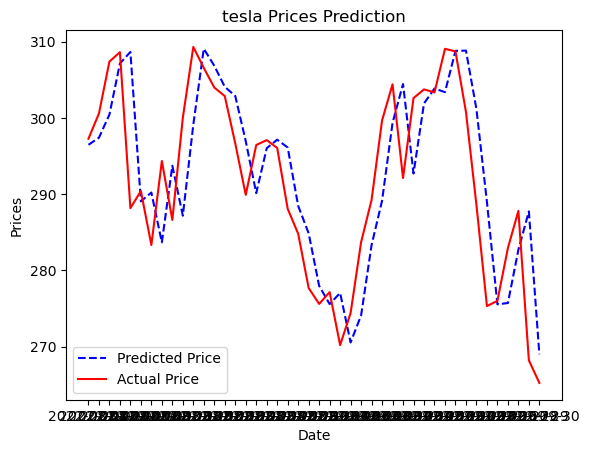

In [183]:
test_set_range = df_val.tsla.index
plt.plot(test_set_range, model_predictions, color='blue', linestyle='dashed',label='Predicted Price')
plt.plot(test_set_range, test_data, color='red', label='Actual Price')
plt.title('tesla Prices Prediction')
plt.xlabel('Date')
plt.ylabel('Prices')
plt.legend()
plt.show()
df_pre['tsla'] = model_predictions

## Optimization

In [186]:
df_pre

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-01,94.422888,162.320662,159.646896,214.886682,114.631503,158.873090,69.529008,49.105901,72.981604,296.482328
2022-08-02,96.713557,160.971089,169.831982,210.703135,112.969427,159.838411,69.329731,47.720712,74.031878,297.411151
2022-08-03,99.251193,159.834395,164.070802,209.600609,111.316577,160.205755,70.055182,49.027408,71.579916,300.444222
2022-08-04,98.014769,166.032693,166.111024,212.874764,112.738439,168.419113,69.798940,49.623405,73.640503,307.144759
2022-08-05,103.959894,165.175066,166.902244,216.351025,110.943147,170.783287,69.633951,51.262109,74.297609,308.658969
2022-08-08,102.191885,165.370032,164.943770,217.724347,115.333334,167.320100,68.605868,50.198524,74.018902,289.065244
2022-08-09,100.105739,164.883148,165.760235,217.538293,112.901983,169.997461,69.348114,47.666585,74.539441,290.223369
2022-08-10,95.563164,164.951562,164.896668,217.561540,114.845727,168.709673,69.996991,47.397457,72.914192,283.677755
2022-08-11,99.162889,169.254042,169.112704,220.222003,117.501659,177.824439,70.184407,47.268466,74.761097,293.738125


In [185]:
df_pred_r=(df_pre-df_pre.shift(periods=1))/df_pre.shift(periods=1)

In [187]:
df_pred_r.dropna(inplace = True)

In [188]:
df_pred_r.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-02,0.024260,-0.008314,0.063798,-0.019469,-0.014499,0.006076,-0.002866,-0.028208,0.014391,0.003133
2022-08-03,0.026239,-0.007061,-0.033923,-0.005233,-0.014631,0.002298,0.010464,0.027382,-0.033120,0.010198
2022-08-04,-0.012458,0.038779,0.012435,0.015621,0.012773,0.051268,-0.003658,0.012156,0.028787,0.022302
2022-08-05,0.060655,-0.005165,0.004763,0.016330,-0.015924,0.014037,-0.002364,0.033023,0.008923,0.004930
2022-08-08,-0.017007,0.001180,-0.011734,0.006348,0.039571,-0.020278,-0.014764,-0.020748,-0.003751,-0.063480


In [189]:
df_return

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-04,-0.038738,-0.012692,0.027759,-0.009871,0.037910,-0.005937,0.001936,-0.111943,0.024521,-0.041833
2022-01-05,-0.057264,-0.026600,-0.002621,-0.010177,-0.018282,-0.036728,-0.009662,-0.025893,0.011004,-0.053471
2022-01-06,0.000588,-0.016693,-0.008119,-0.008233,0.010624,0.025573,-0.010035,0.074181,0.012245,-0.021523
2022-01-07,-0.031050,0.000988,0.019684,-0.019806,0.009908,-0.002015,0.008166,0.072319,0.039337,-0.035447
2022-01-10,0.000000,0.000116,-0.028724,0.011651,0.000957,-0.011212,-0.000978,0.019499,-0.000172,0.030342
...,...,...,...,...,...,...,...,...,...,...
2022-10-24,-0.002040,0.014803,0.005166,0.026156,0.001227,-0.002231,0.021022,-0.246057,0.000315,-0.014876
2022-10-25,0.047189,0.019338,0.032383,-0.003860,0.002615,0.060052,0.033288,0.069051,0.028535,0.052876
2022-10-26,-0.028307,-0.019627,-0.087692,0.025113,0.011491,-0.055923,0.001676,0.116979,0.031116,0.009981


### Check the binary status

In [208]:
df_pred_binary = df_pred_r.copy(deep=True)
df_pred_binary[df_pred_binary>0] = 1
df_pred_binary[df_pred_binary<=0] = 0
df_pred_binary.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-02,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
2022-08-03,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
2022-08-04,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0
2022-08-05,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0
2022-08-08,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [198]:
date = '2022-08-02'
df_return_binary = df_return.loc[date:'2022-09-30',:].copy(deep=True)
df_return_binary[df_return_binary>0] = 1
df_return_binary[df_return_binary<=0] = 0
df_return_binary.head()

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-02,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
2022-08-03,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0
2022-08-04,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0
2022-08-05,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2022-08-08,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0


In [199]:
company_lst

['amd', 'aapl', 'ba', 'biib', 'jpm', 'meta', 'ngg', 'pdd', 'ryaay', 'tsla']

In [200]:
binary_acc = []
for company in company_lst:
    binary_acc.append(np.mean(df_return_binary[company] == df_pred_binary[company]))

In [201]:
binary_acc

[0.5581395348837209,
 0.46511627906976744,
 0.4186046511627907,
 0.5348837209302325,
 0.5813953488372093,
 0.5581395348837209,
 0.6046511627906976,
 0.4883720930232558,
 0.3488372093023256,
 0.5348837209302325]

## Optimization using Minimum Variance and Sharpe Ratio

In [202]:
### Avg predicted return error of past n days:
def cal_mean_return_error(actual,pred,n):
    a=actual-pred
    tmp=a.copy()
    for i in range(n-1):
        a=a+tmp.shift(periods=i+1)
    return a.shift(1)/10
mean_return_error_10=cal_mean_return_error(df_return,df_pred_r,10)

In [203]:
risk_free=0.0404 #for Oct 26 2022
stock_return  = df_return.copy()
def get_optimal_portfolio(num=10000,date='09-28',method='mv'):
    random_p = np.empty((num, 12))
    ### set a random seed so that optimal potfolio might not change over consecutive date
    np.random.seed(7) 
    for i in range(num):
        random10=np.random.random(10)
        random_weight=random10/np.sum(random10)
        mean_return=stock_return.loc[:date,:].mul(random_weight,axis=1).sum(axis=1).mean()
        annual_return=mean_return * 252
#         annual_return=(1+mean_return)**stock_return.loc[:date,:].shape[0]-1
        cov_mat = stock_return.loc[:date,:].cov()
        cov_mat_annual = cov_mat * 252
        random_volatility=np.sqrt(np.dot(random_weight.T,np.dot(cov_mat_annual,random_weight)))
        pred_return=df_pred_r.loc[date,:].mul(random_weight).sum()
        return_error=mean_return_error_10.loc[date,:].mul(random_weight).sum()
        neg_sharpe_ratio = -(annual_return-risk_free)/random_volatility
    # Minimize var and maximize expected portfolio return and sample period’s abnormal return
        if method == 'mv':
            obj_f=random_volatility-2*pred_return-2*return_error
        elif method == 'sharpe':
            obj_f= neg_sharpe_ratio-10*pred_return-10*return_error
            
        random_p[i][:10]=random_weight
        random_p[i][10]=annual_return
        random_p[i][11]=obj_f
      
    RandomPortfolios=pd.DataFrame(random_p)
    RandomPortfolios.columns=[company +'_weight' for company in company_lst]+['Returns','Obj']

    min_index = RandomPortfolios.Obj.idxmin()

    RandomPortfolios.plot('Obj', 'Returns', kind='scatter', alpha=0.3)
    x = RandomPortfolios.loc[min_index,'Obj']
    y = RandomPortfolios.loc[min_index,'Returns']
    plt.scatter(x, y, color='red')

    plt.text(np.round(x,4),np.round(y,4),(np.round(x,4),np.round(y,4)),ha='left',va='bottom',fontsize=10)
    plt.show()

    numstocks = 10

    GMV_weights = np.array(RandomPortfolios.iloc[min_index, 0:numstocks])

    return GMV_weights

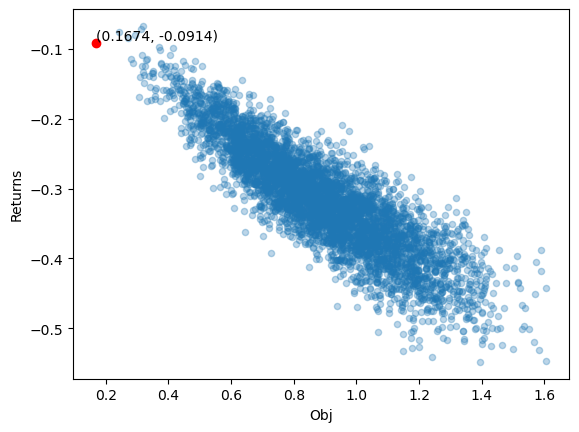

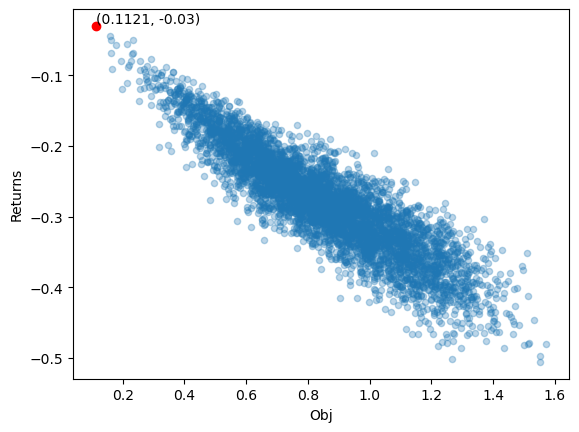

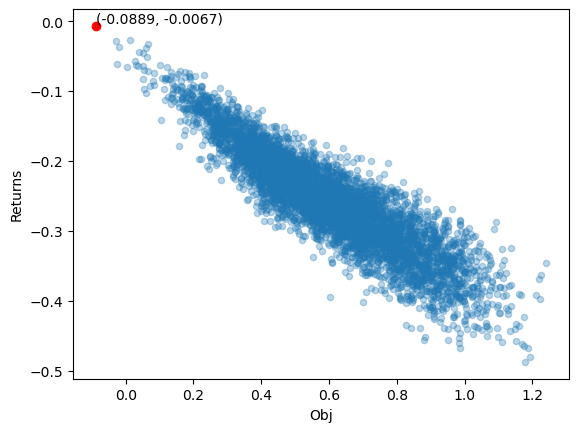

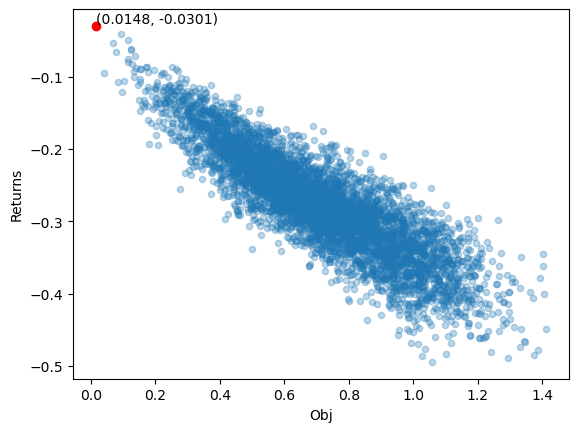

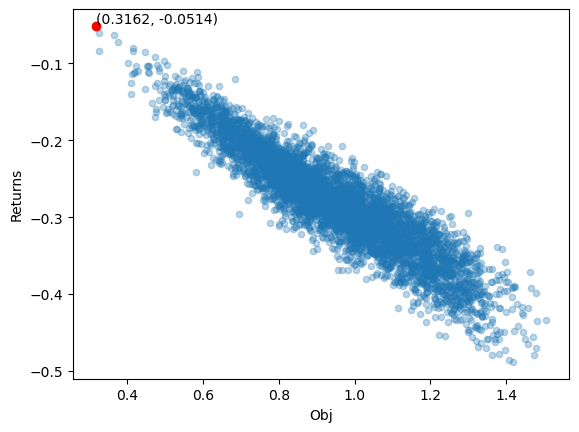

...

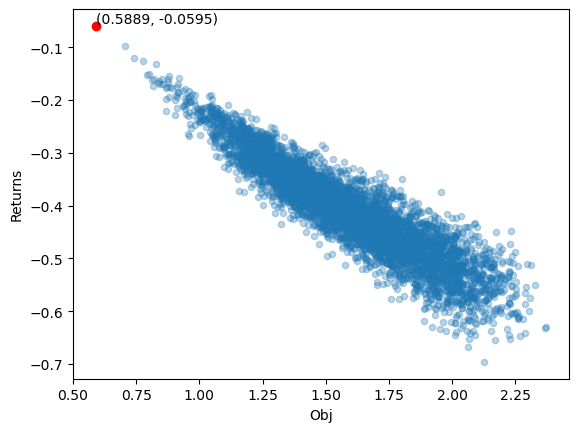

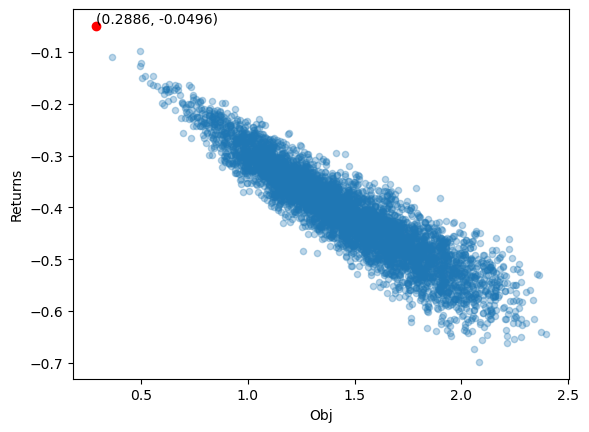

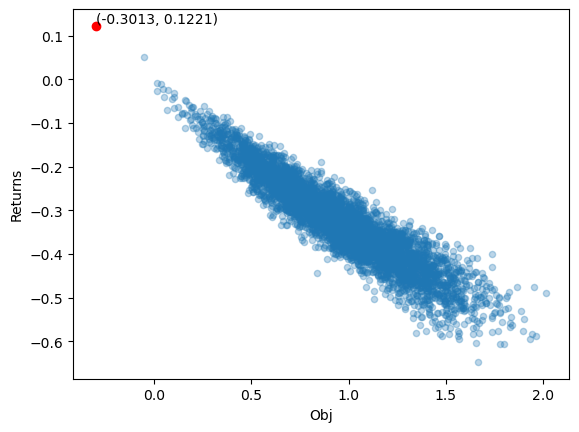

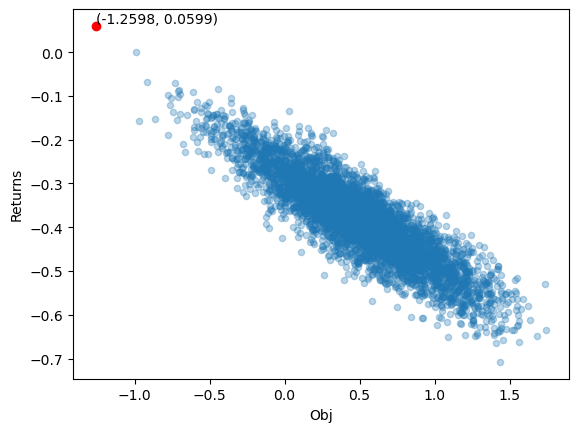

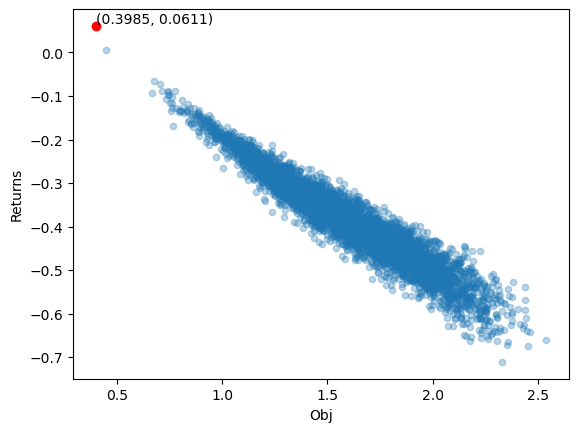

In [215]:
#### get daily optimal weight for Aug and Sep
weight={}
date_list=df_val.loc['2022-08-02':,:].index
for date in date_list:
    weight[date]=get_optimal_portfolio(num=5000,date=date,method='sharpe')

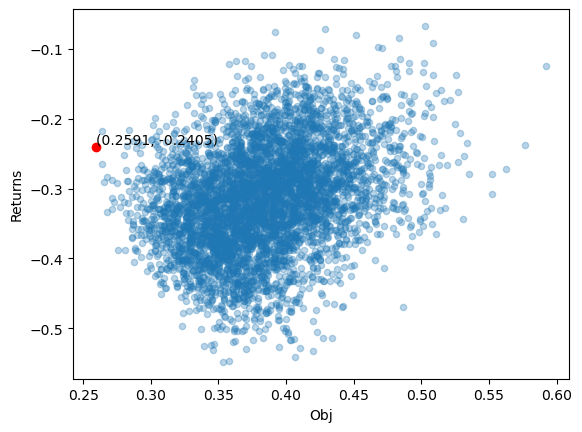

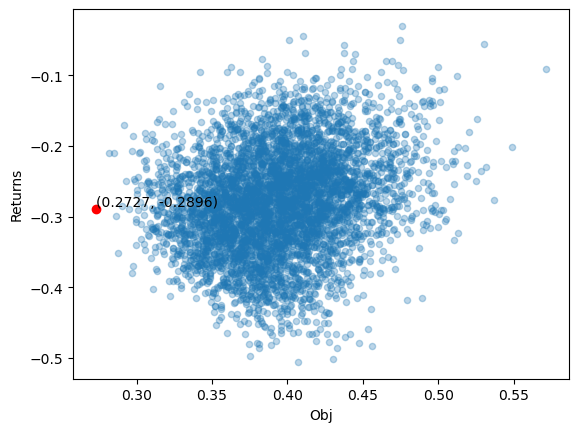

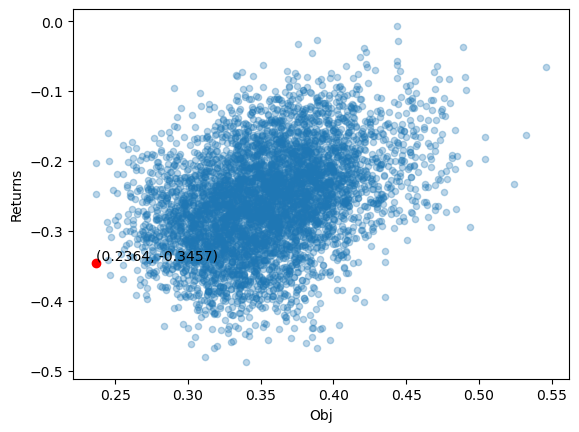

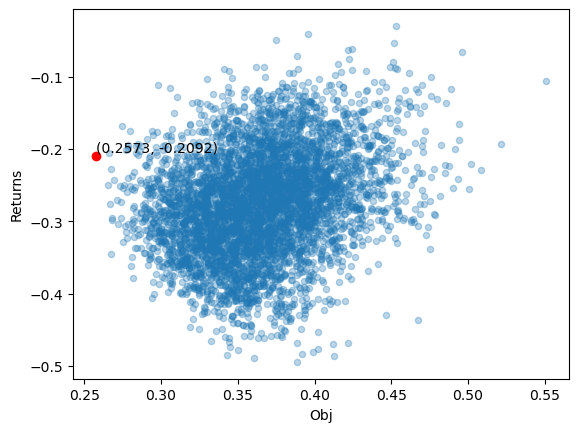

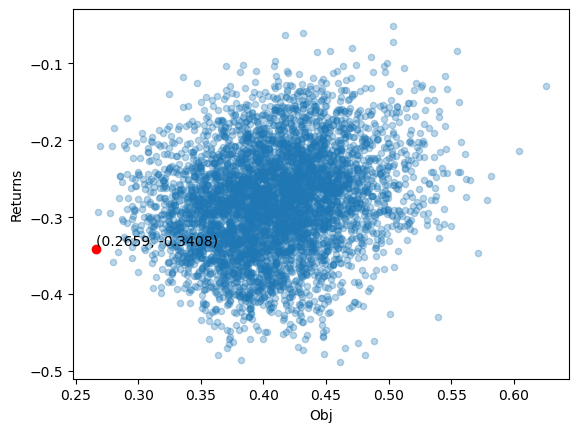

...

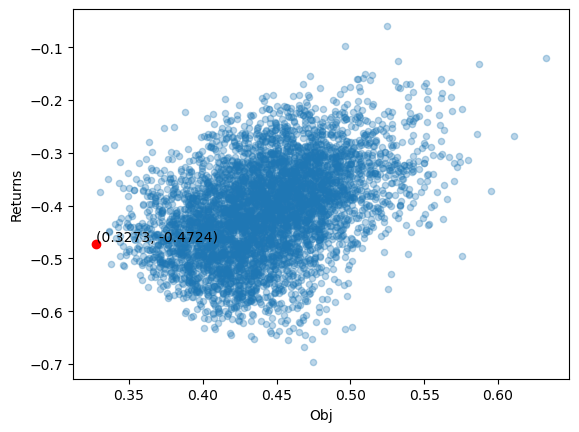

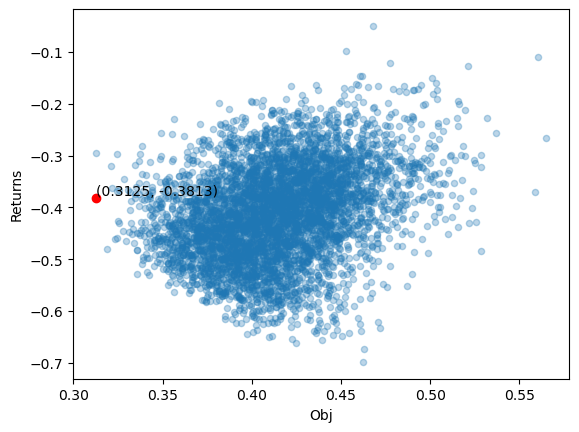

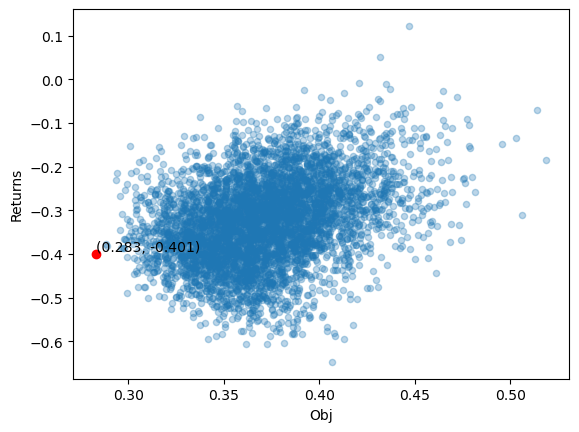

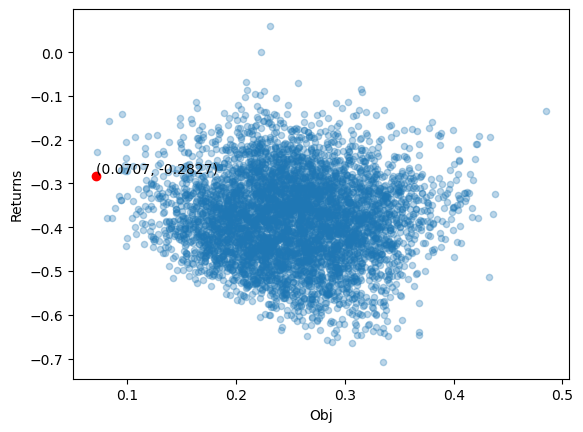

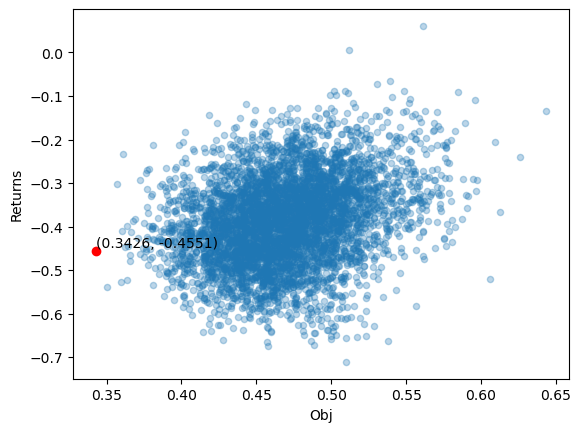

In [216]:
### get daily optimal weight for Aug and Sep
weight_2={}
date_list=df_val.loc['2022-08-02':,:].index
for date in date_list:
    weight_2[date]=get_optimal_portfolio(num=5000,date=date,method='mv')


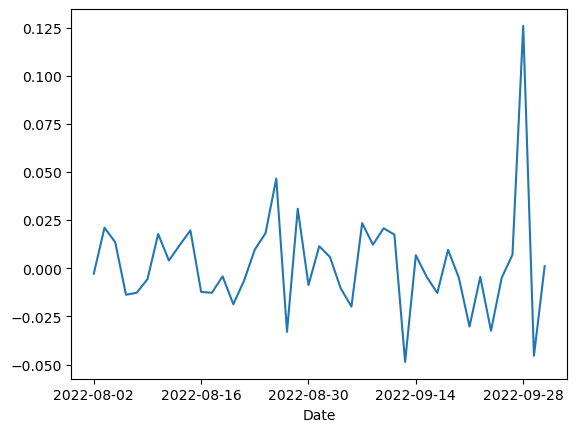

In [219]:
### Return for Aug and Sep (Sharpe + Prediction)
WeightedReturns = stock_return.loc['2022-08-02':'2022-09-30',:]*pd.DataFrame.from_dict(weight, orient='index',columns=company_lst)
df_return['Portfolio'] = WeightedReturns.sum(axis=1)
df_return.loc['2022-08-02':'2022-09-30',:].Portfolio.plot()
plt.show()

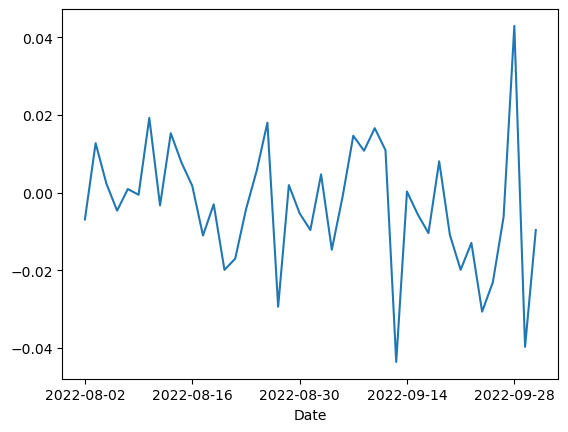

In [220]:
### Return for Aug and Sep (MV + Prediction)
WeightedReturns = stock_return.loc[
    '2022-08-02':'2022-09-30',:]*pd.DataFrame.from_dict(weight_2, orient='index',columns=company_lst)
df_return['Portfolio'] = WeightedReturns.sum(axis=1)
df_return.loc['2022-08-02':'2022-09-30',:].Portfolio.plot()
plt.show()

In [221]:
pd.DataFrame.from_dict(weight, orient='index',columns=company_lst)

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
2022-08-02,0.006462,0.075337,0.269599,0.092737,0.024221,0.017155,0.045740,0.266050,0.059288,0.143411
2022-08-03,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-04,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-05,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-08,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-09,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-10,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-11,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-12,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863
2022-08-15,0.011099,0.161078,0.059873,0.280697,0.037937,0.010310,0.034807,0.249542,0.011794,0.142863


In [222]:
pd.DataFrame.from_dict(weight_2, orient='index',columns=company_lst)

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
2022-08-02,0.007521,0.096642,0.169688,0.227019,0.133981,0.021346,0.216091,0.024072,0.049842,0.053797
2022-08-03,0.031375,0.031028,0.062044,0.047855,0.275893,0.072903,0.308017,0.014181,0.023442,0.133261
2022-08-04,0.004832,0.048549,0.087062,0.211586,0.260660,0.117969,0.157412,0.004746,0.052557,0.054627
2022-08-05,0.007521,0.096642,0.169688,0.227019,0.133981,0.021346,0.216091,0.024072,0.049842,0.053797
2022-08-08,0.004832,0.048549,0.087062,0.211586,0.260660,0.117969,0.157412,0.004746,0.052557,0.054627
2022-08-09,0.007521,0.096642,0.169688,0.227019,0.133981,0.021346,0.216091,0.024072,0.049842,0.053797
2022-08-10,0.007521,0.096642,0.169688,0.227019,0.133981,0.021346,0.216091,0.024072,0.049842,0.053797
2022-08-11,0.004832,0.048549,0.087062,0.211586,0.260660,0.117969,0.157412,0.004746,0.052557,0.054627
2022-08-12,0.007521,0.096642,0.169688,0.227019,0.133981,0.021346,0.216091,0.024072,0.049842,0.053797
2022-08-15,0.031375,0.031028,0.062044,0.047855,0.275893,0.072903,0.308017,0.014181,0.023442,0.133261


## Calculate cumulative return for validation data

In [223]:
df_pred_r

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-02,0.024260,-0.008314,0.063798,-0.019469,-0.014499,0.006076,-0.002866,-0.028208,0.014391,0.003133
2022-08-03,0.026239,-0.007061,-0.033923,-0.005233,-0.014631,0.002298,0.010464,0.027382,-0.033120,0.010198
2022-08-04,-0.012458,0.038779,0.012435,0.015621,0.012773,0.051268,-0.003658,0.012156,0.028787,0.022302
2022-08-05,0.060655,-0.005165,0.004763,0.016330,-0.015924,0.014037,-0.002364,0.033023,0.008923,0.004930
2022-08-08,-0.017007,0.001180,-0.011734,0.006348,0.039571,-0.020278,-0.014764,-0.020748,-0.003751,-0.063480
2022-08-09,-0.020414,-0.002944,0.004950,-0.000855,-0.021081,0.016001,0.010819,-0.050439,0.007033,0.004006
2022-08-10,-0.045378,0.000415,-0.005210,0.000107,0.017216,-0.007575,0.009357,-0.005646,-0.021804,-0.022554
2022-08-11,0.037669,0.026083,0.025568,0.012229,0.023126,0.054026,0.002677,-0.002721,0.025330,0.035464
2022-08-12,-0.011327,-0.006223,-0.004623,-0.007270,0.015007,0.000237,-0.009876,0.050430,-0.000330,-0.022308


In [224]:
pred_cum_return = [1]*10
for index in range(df_pred_r.shape[0]):
    pred_cum_return = pred_cum_return * (1+df_pred_r.loc[date_list[index],:])
    

In [225]:
pred_cum_return

amd      0.678613
aapl     0.879092
ba       0.786964
biib     1.195001
jpm      0.914600
meta     0.861166
ngg      0.743186
pdd      1.240068
ryaay    0.789444
tsla     0.907304
dtype: float64

In [227]:
df_return_val = df_return.loc['2022-08-02':'2022-09-30',:]
cum_return = [1]*11
for index in range(df_return_val.shape[0]):
    cum_return = cum_return * (1+df_return_val.loc[date_list[index],:])

In [228]:
cum_return

amd          0.654681
aapl         0.856863
ba           0.716153
biib         1.275925
jpm          0.914981
meta         0.848371
ngg          0.742721
pdd          1.312225
ryaay        0.789459
tsla         0.892266
Portfolio    0.857170
dtype: float64

In [229]:
df_return.loc['2022-08-02':'2022-09-30',:]

,amd,aapl,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla,Portfolio
Date,,,,,,,,,,,
2022-08-02,0.025935,-0.009287,-0.034246,-0.000526,-0.015585,0.001626,0.009945,0.027050,-0.032162,0.011134,-0.006890
2022-08-03,-0.012086,0.038248,0.020578,0.021277,0.010495,0.053749,-0.003425,0.013679,0.029042,0.022656,0.012756
2022-08-04,0.059333,-0.001926,-0.000840,0.017322,-0.011003,0.010486,-0.003151,0.032427,0.006377,0.004023,0.002367
2022-08-05,-0.015398,-0.001389,-0.008769,0.004142,0.030260,-0.020285,-0.015228,-0.019703,-0.002292,-0.066303,-0.004623
2022-08-08,-0.021894,-0.002903,0.005150,-0.002933,-0.012180,0.018790,0.011233,-0.051343,0.007162,0.007819,0.000951
2022-08-09,-0.045268,0.000303,-0.006269,0.000138,0.009007,-0.010103,0.010964,-0.007132,-0.021334,-0.024413,-0.000532
2022-08-10,0.036739,0.026195,0.025296,0.015855,0.026088,0.058209,0.002283,-0.001479,0.025363,0.038906,0.019252
2022-08-11,-0.009389,-0.004432,-0.006745,-0.012758,0.014782,-0.004766,-0.010962,0.049937,-0.002006,-0.026249,-0.003284
2022-08-12,0.027619,0.021426,0.012569,0.012694,0.016564,0.016959,0.013675,-0.016526,0.007369,0.046750,0.015314


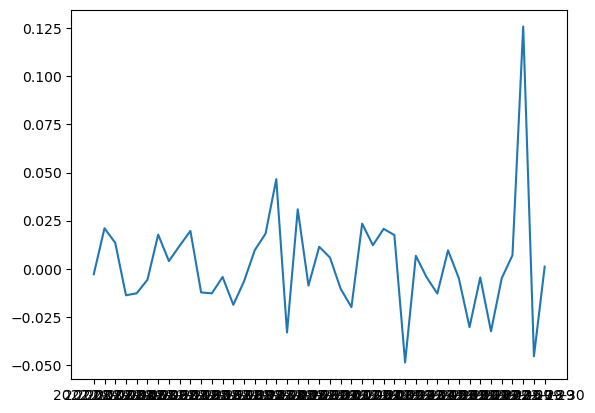

Portfolio validation period return: 7.22%


In [231]:
### Return for Aug and Sep (Sharpe + Prediction)
WeightedReturns=df_return.loc['2022-08-02':'2022-09-30',:'tsla']*pd.DataFrame.from_dict(weight, orient='index',columns=company_lst)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio validation period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

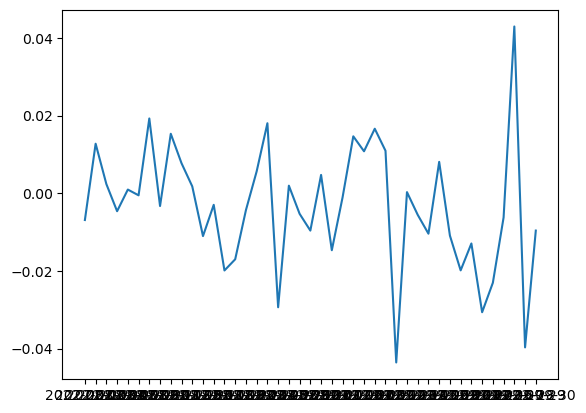

Portfolio validation period return: -14.28%


In [232]:
### Return for Aug and Sep (MV + Prediction)
WeightedReturns=df_return.loc['2022-08-02':'2022-09-30',:'tsla']*pd.DataFrame.from_dict(weight_2, orient='index',columns=company_lst)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio validation period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

# Test result

In [233]:
test_df = df_return.loc['2022-10-03':,:'tsla']

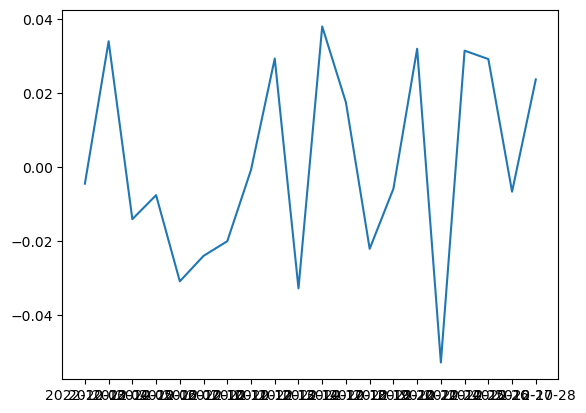

Portfolio test period return: 0.70%


In [234]:
### Return based on (Sharpe + Prediction) last date weight
WeightedReturns=test_df.mul(weight['2022-09-30'], axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

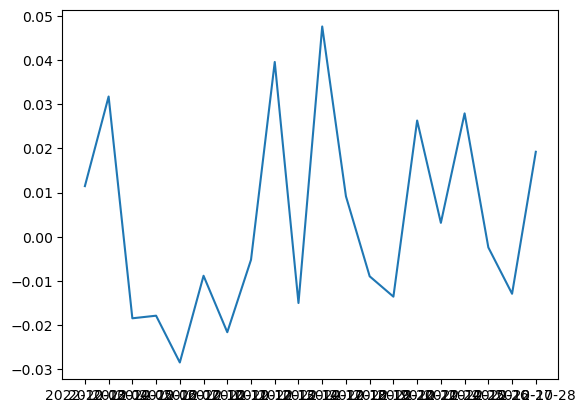

Portfolio test period return: 6.00%


In [235]:
## Return based on (MV + Prediction) last date weight
WeightedReturns=test_df.mul(weight_2['2022-09-30'], axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

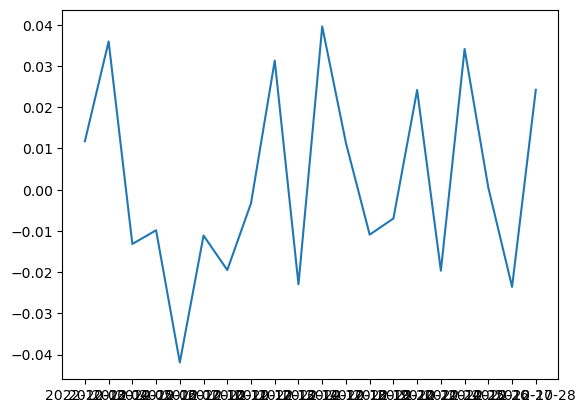

Portfolio test period return: 2.51%


In [236]:
portfolio_weights = np.array([0.1]*10)
WeightedReturns=test_df.mul(portfolio_weights, axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))